In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Importando la biblioteca pandas para manipulación y análisis de datos
import pandas as pd

# Importando NumPy para operaciones numéricas y manipulación de arreglos
import numpy as np

# Importando Seaborn para visualización de datos estadísticos (opcional, pero puede complementar a Plotly)
import seaborn as sns

# Importando Plotly Express para visualizaciones interactivas de alto nivel y fáciles de usar
import plotly.express as px

# Importando matplotlib.pyplot para crear gráficos y visualizaciones
import matplotlib.pyplot as plt

# Importando Plotly Graph Objects para un control más detallado sobre las visualizaciones
import plotly.graph_objects as go

# Importando itertools para generar combinaciones de columnas
import itertools

# Importando la función seasonal_decompose para la descomposición de series temporales
from statsmodels.tsa.seasonal import seasonal_decompose


In [ ]:
cash_request=pd.read_csv('drive/MyDrive/ColabNotebooks/Business_Payments/extract - cash request - data analyst.csv')
fees=pd.read_csv('drive/MyDrive/ColabNotebooks/Business_Payments/extract - fees - data analyst - .csv')

In [ ]:
# Configurando el tamaño de la figura para matplotlib (aunque no se usa en px.imshow directamente)
plt.figure(figsize=(10, 8))

# Creando un mapa de calor para visualizar los valores faltantes en el DataFrame cash_request
fig1 = px.imshow(
    cash_request.isnull(),
    color_continuous_scale=['black', 'red'],
    labels=dict(color="NaN"),
    title="Mapa de calor para cash_request"
)

# Ajustando las dimensiones del gráfico
fig1.update_layout(width=500, height=500)

# Ocultando la barra de colores del mapa de calor
fig1.update_coloraxes(showscale=False)

# Mostrando el gráfico interactivo
fig1.show()


<Figure size 1000x800 with 0 Axes>

In [ ]:
# Creando un mapa de calor para visualizar los valores faltantes en el DataFrame fees
fig2 = px.imshow(
    fees.isnull(),
    color_continuous_scale=['black', 'red'],
    labels=dict(color="NaN"),
    title="Mapa de calor para fees"
)

# Ajustando las dimensiones del gráfico
fig2.update_layout(width=500, height=500)

# Ocultando la barra de colores del mapa de calor
fig2.update_coloraxes(showscale=False)

# Mostrando el gráfico interactivo
fig2.show()


In [ ]:
cash_request.describe()

,id,amount,user_id,deleted_account_id
count,23970.000000,23970.000000,21867.000000,2104.000000
mean,13910.966124,82.720818,32581.250789,9658.755228
std,7788.117214,26.528065,27618.565773,7972.743249
min,3.000000,1.000000,34.000000,91.000000
25%,7427.250000,50.000000,10804.000000,3767.000000
50%,14270.500000,100.000000,23773.000000,6121.500000
75%,20607.750000,100.000000,46965.000000,16345.000000
max,27010.000000,200.000000,103719.000000,30445.000000


In [ ]:
fees.describe()

,id,cash_request_id,total_amount
count,21061.000000,21057.000000,21061.000000
mean,10645.355111,16318.449162,5.000237
std,6099.315256,6656.149949,0.034453
min,1.000000,1456.000000,5.000000
25%,5385.000000,11745.000000,5.000000
50%,10652.000000,17160.000000,5.000000
75%,15925.000000,21796.000000,5.000000
max,21193.000000,27010.000000,10.000000


In [ ]:
cash_request.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23970 entries, 0 to 23969
Data columns (total 16 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   id                          23970 non-null  int64  
 1   amount                      23970 non-null  float64
 2   status                      23970 non-null  object 
 3   created_at                  23970 non-null  object 
 4   updated_at                  23970 non-null  object 
 5   user_id                     21867 non-null  float64
 6   moderated_at                16035 non-null  object 
 7   deleted_account_id          2104 non-null   float64
 8   reimbursement_date          23970 non-null  object 
 9   cash_request_received_date  16289 non-null  object 
 10  money_back_date             16543 non-null  object 
 11  transfer_type               23970 non-null  object 
 12  send_at                     16641 non-null  object 
 13  recovery_status             333

In [ ]:
fees.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21061 entries, 0 to 21060
Data columns (total 13 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   id               21061 non-null  int64  
 1   cash_request_id  21057 non-null  float64
 2   type             21061 non-null  object 
 3   status           21061 non-null  object 
 4   category         2196 non-null   object 
 5   total_amount     21061 non-null  float64
 6   reason           21061 non-null  object 
 7   created_at       21061 non-null  object 
 8   updated_at       21061 non-null  object 
 9   paid_at          15531 non-null  object 
 10  from_date        7766 non-null   object 
 11  to_date          7766 non-null   object 
 12  charge_moment    21061 non-null  object 
dtypes: float64(2), int64(1), object(10)
memory usage: 2.1+ MB


REVISIÓN DE COLUMNAS CON VALORES CLAVE

In [ ]:
# Obteniendo una lista de las columnas del DataFrame cash_request
columnas_cash_request = cash_request.columns.tolist()

# Iterando sobre cada columna para mostrar los valores más frecuentes
for i in columnas_cash_request:
    print("===========================")
    print(f"Columna: {i}")
    print(cash_request[i].value_counts().head(10))
    print()


Columna: id
id
5        1
15322    1
19569    1
15338    1
15329    1
15341    1
15336    1
15334    1
15165    1
15346    1
Name: count, dtype: int64

Columna: amount
amount
100.0    16094
50.0      5304
25.0      1276
80.0       267
60.0       190
70.0       151
20.0       132
30.0       114
40.0       100
90.0        91
Name: count, dtype: int64

Columna: status
status
money_back               16397
rejected                  6568
direct_debit_rejected      831
active                      59
transaction_declined        48
direct_debit_sent           34
canceled                    33
Name: count, dtype: int64

Columna: created_at
created_at
2019-12-10 19:05:21.596873+00    1
2020-09-09 11:06:31.382449+00    1
2020-10-07 05:56:54.442506+00    1
2020-09-09 12:32:29.661278+00    1
2020-09-09 11:42:31.956338+00    1
2020-09-09 12:43:05.909299+00    1
2020-09-09 12:23:09.95394+00     1
2020-09-09 12:16:17.993242+00    1
2020-09-08 16:01:25.146577+00    1
2020-09-09 12:57:42.599222+00    1


In [ ]:
# Obteniendo una lista de las columnas del DataFrame fees
columnas_fees = fees.columns.tolist()

# Iterando sobre cada columna para mostrar los valores más frecuentes
for i in columnas_fees:
    print("===========================")
    print(f"Columna: {i}")
    print(fees[i].value_counts().head(10))
    print()


Columna: id
id
6537    1
7852    1
7846    1
7844    1
6968    1
7819    1
7816    1
7815    1
9183    1
7814    1
Name: count, dtype: int64

Columna: cash_request_id
cash_request_id
12225.0    35
5006.0     28
4410.0     24
12452.0    23
11376.0    21
2358.0     19
11746.0    17
15319.0    16
4956.0     15
8713.0     15
Name: count, dtype: int64

Columna: type
type
instant_payment    11099
postpone            7766
incident            2196
Name: count, dtype: int64

Columna: status
status
accepted     14841
cancelled     4938
rejected      1194
confirmed       88
Name: count, dtype: int64

Columna: category
category
rejected_direct_debit     1599
month_delay_on_payment     597
Name: count, dtype: int64

Columna: total_amount
total_amount
5.0     21060
10.0        1
Name: count, dtype: int64

Columna: reason
reason
rejected direct debit               1599
month delay on payment - 9/2020      283
month delay on payment - 8/2020      203
month delay on payment - 10/2020     102
Postpone C

VISUALIZACIÓN DE DISTRIBUCIONES DE DATOS

In [ ]:
# Obteniendo una lista de columnas numéricas a partir del método describe
columnas_numericas_cash_request = cash_request.describe().columns.tolist()

# Iterando sobre cada columna numérica para crear histogramas
for c in columnas_numericas_cash_request:
    fig = px.histogram(
        cash_request,
        x=c,
        title=f'Histograma de {c}'
    )
    # Ajustando la altura del gráfico
    fig.update_layout(height=500)
    # Mostrando el gráfico interactivo
    fig.show()


In [ ]:
# Obteniendo una lista de columnas numéricas a partir del método describe
columnas_numericas_fees = fees.describe().columns.tolist()

# Iterando sobre cada columna numérica para crear histogramas
for c in columnas_numericas_fees:
    fig = px.histogram(
        fees,
        x=c,
        title=f'Histograma de {c}'
    )
    # Ajustando la altura del gráfico
    fig.update_layout(height=500)
    # Mostrando el gráfico interactivo
    fig.show()


In [ ]:
# Iterando sobre cada columna en columnas_cash_request
for c in columnas_cash_request:
    if c not in columnas_numericas_cash_request:
        # Contando la frecuencia de valores únicos en la columna
        counts = cash_request[c].value_counts()

        # Verificando si la cantidad de valores únicos es menor o igual a 10
        if len(counts) <= 10:
            # Creando un gráfico de pastel para la distribución de la columna
            fig = px.pie(
                names=counts.index,
                values=counts.values,
                title=f'Distribución de {c}'
            )
            # Ajustando la altura del gráfico
            fig.update_layout(height=300)
            # Mostrando el gráfico interactivo
            fig.show()


In [ ]:
# Iterando sobre cada columna en columnas_fees
for c in columnas_fees:
    if c not in columnas_numericas_fees:
        # Contando la frecuencia de valores únicos en la columna
        counts = fees[c].value_counts()

        # Verificando si la cantidad de valores únicos es menor o igual a 10
        if len(counts) <= 10:
            # Creando un gráfico de pastel para la distribución de la columna
            fig = px.pie(
                names=counts.index,
                values=counts.values,
                title=f'Distribución de {c}'
            )
            # Ajustando la altura del gráfico
            fig.update_layout(height=300)
            # Mostrando el gráfico interactivo
            fig.show()


IDENTIFICACIÓN DE VALORES ATÍPICOS

In [ ]:
# Iterando sobre cada columna numérica en cash_request
for c in columnas_numericas_cash_request:
    # Creando un diagrama de caja (boxplot) para la columna
    fig = px.box(
        cash_request,
        y=c,
        title=f'Boxplot de {c}'
    )
    # Ajustando la altura del gráfico
    fig.update_layout(height=500)
    # Mostrando el gráfico interactivo
    fig.show()


In [ ]:
# Iterando sobre cada columna numérica en fees
for c in columnas_numericas_fees:
    # Creando un diagrama de caja (boxplot) para la columna
    fig = px.box(
        fees,
        y=c,
        title=f'Boxplot de {c}'
    )
    # Ajustando la altura del gráfico
    fig.update_layout(height=500)
    # Mostrando el gráfico interactivo
    fig.show()


In [ ]:
# Iterando sobre cada columna numérica en cash_request
for c in columnas_numericas_cash_request:
    # Creando un diagrama de violín (violin plot) para la columna
    fig = px.violin(
        cash_request,
        y=c,
        title=f'Violinplot de {c}'
    )
    # Ajustando la altura del gráfico
    fig.update_layout(height=500)
    # Mostrando el gráfico interactivo
    fig.show()


In [ ]:
# Iterando sobre cada columna numérica en fees
for c in columnas_numericas_fees:
    # Creando un diagrama de violín (violin plot) para la columna
    fig = px.violin(
        fees,
        y=c,
        title=f'Violinplot de {c}'
    )
    # Ajustando la altura del gráfico
    fig.update_layout(height=500)
    # Mostrando el gráfico interactivo
    fig.show()


GRAFICOS DE DISPERSIÓN

In [ ]:
# Generando gráficos de dispersión para todas las combinaciones de columnas numéricas
for c1, c2 in itertools.combinations(columnas_numericas_cash_request, 2):
    # Creando un gráfico de dispersión para la combinación actual
    fig = px.scatter(
        cash_request,
        x=c1,
        y=c2,
        title=f'Gráfico de dispersión de {c1} vs {c2}'
    )
    # Ajustando la altura del gráfico
    fig.update_layout(height=500)
    # Mostrando el gráfico interactivo
    fig.show()


In [ ]:
# Generando gráficos de dispersión para todas las combinaciones de columnas numéricas en fees
for c1, c2 in itertools.combinations(columnas_numericas_fees, 2):
    # Creando un gráfico de dispersión para la combinación actual
    fig = px.scatter(
        fees,
        x=c1,
        y=c2,
        title=f'Gráfico de dispersión de {c1} vs {c2}'
    )
    # Mostrando el gráfico interactivo
    fig.show()


GRAFICOS DE DISPERSIÓN CON LÍNEA DE REGRESIÓN (TENDENCIA)

In [ ]:
# Generando gráficos de dispersión con línea de tendencia para todas las combinaciones de columnas numéricas
for c1, c2 in itertools.combinations(columnas_numericas_cash_request, 2):
    # Creando un gráfico de dispersión con línea de tendencia (OLS)
    fig = px.scatter(
        cash_request,
        x=c1,
        y=c2,
        title=f'Gráfico de dispersión de {c1} vs {c2} con línea de tendencia',
        trendline="ols"  # Agregar línea de tendencia (OLS)
    )
    # Personalizando la línea de tendencia: color rojo y ancho de línea
    fig.update_traces(
        line=dict(color='red', width=3),
        selector=dict(mode='lines')  # Seleccionar solo la línea de tendencia
    )
    # Ajustando la altura del gráfico
    fig.update_layout(height=500)
    # Mostrando el gráfico interactivo
    fig.show()


In [ ]:
# Generando gráficos de dispersión con línea de tendencia para todas las combinaciones de columnas numéricas
for c1, c2 in itertools.combinations(columnas_numericas_fees, 2):
    # Creando un gráfico de dispersión con línea de tendencia (OLS)
    fig = px.scatter(
        fees,
        x=c1,
        y=c2,
        title=f'Gráfico de dispersión de {c1} vs {c2} con línea de tendencia',
        trendline="ols"  # Agregar línea de tendencia (OLS)
    )
    # Personalizando la línea de tendencia: color rojo y ancho de línea
    fig.update_traces(
        line=dict(color='red', width=3),
        selector=dict(mode='lines')  # Seleccionar solo la línea de tendencia
    )
    # Ajustando la altura del gráfico
    fig.update_layout(height=500)
    # Mostrando el gráfico interactivo
    fig.show()


GRAFICOS SERIES TEMPORALES

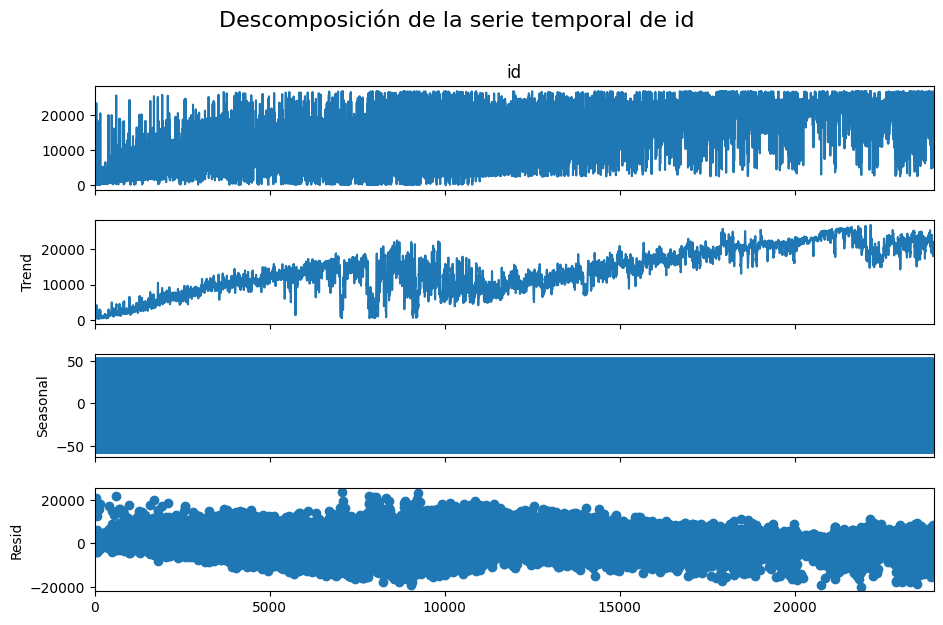

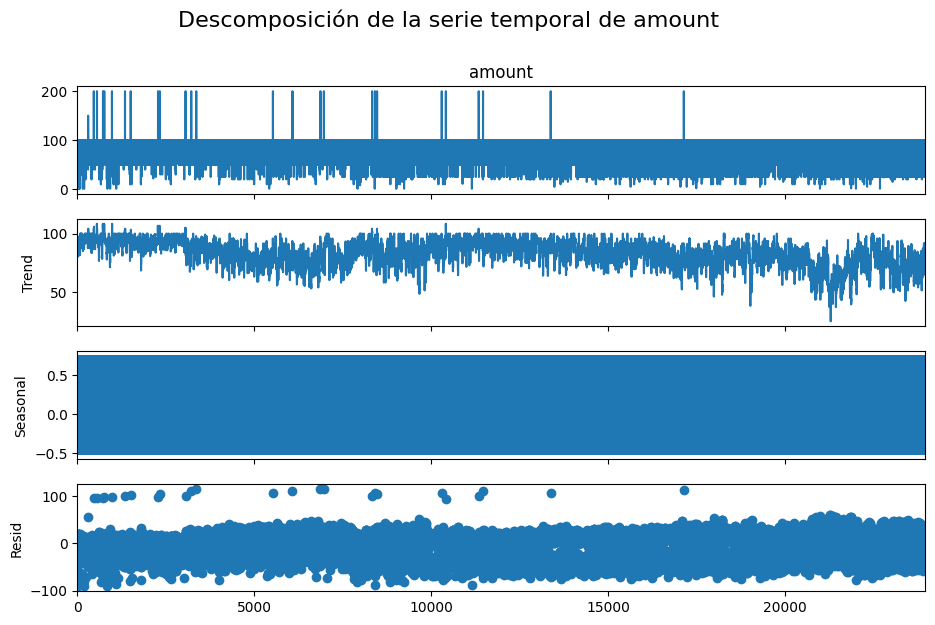

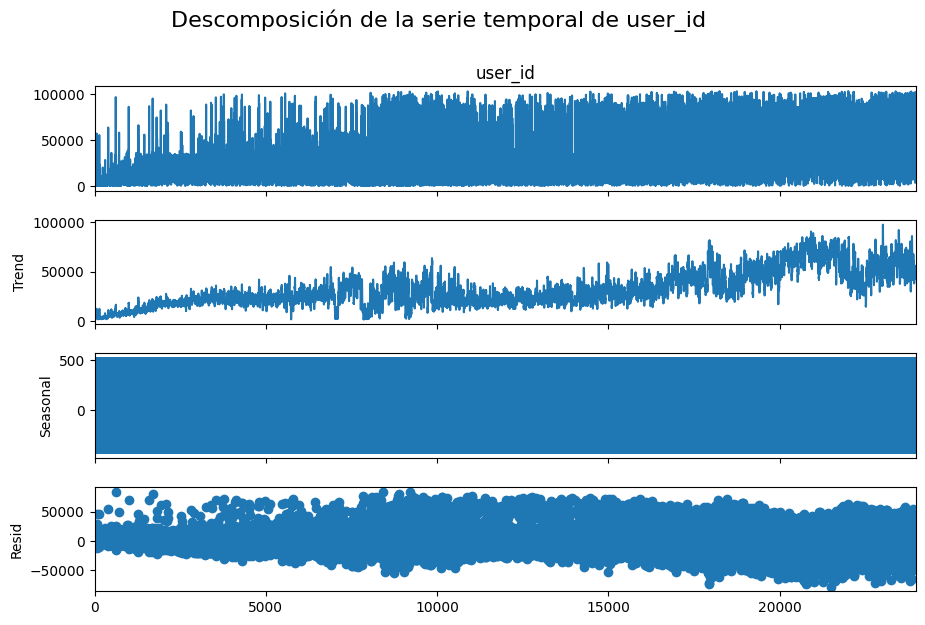

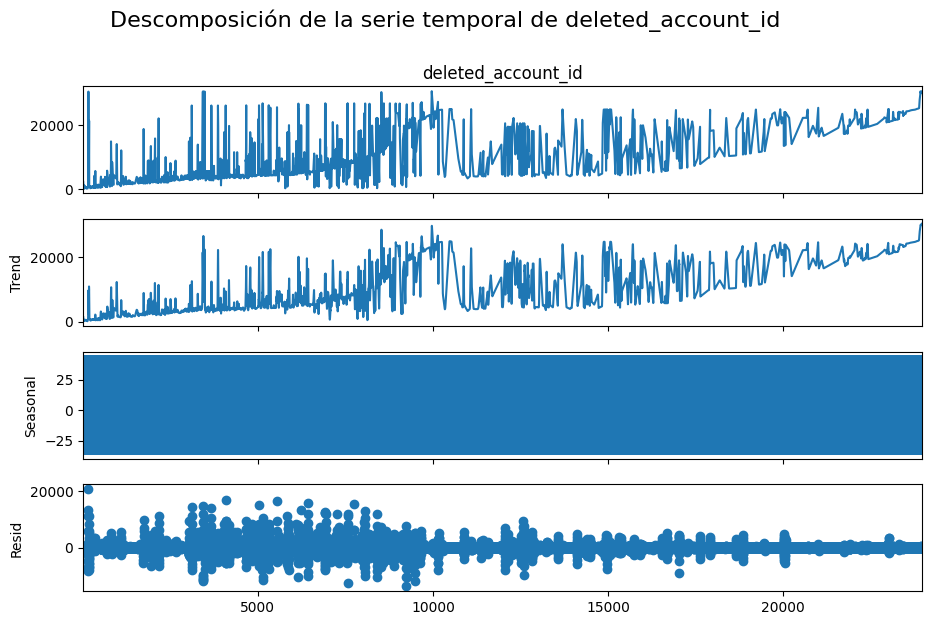

In [ ]:
# Descomposición de series temporales para cada columna numérica individual
for c in columnas_numericas_cash_request:
    # Crear una copia del DataFrame para trabajar
    cash_request_copy = cash_request[c].copy()

    # Verificar si hay valores faltantes y eliminarlos o interpolarlos
    if cash_request_copy.isnull().any():
        cash_request_copy = cash_request_copy.interpolate()  # Rellenar NaN con interpolación
        cash_request_copy = cash_request_copy.dropna()  # Eliminar filas con valores faltantes

    # Verificar que no haya valores no finitos
    if not np.isfinite(cash_request_copy).all():
        print(f'La columna {c} contiene valores no finitos, se omite la descomposición.')
        continue

    # Descomposición de la serie temporal
    descomposicion = seasonal_decompose(cash_request_copy, model='additive', period=12)

    # Graficar la descomposición
    fig = descomposicion.plot()

    # Ajustar el tamaño de la figura con matplotlib
    plt.gcf().set_size_inches(10, 6)

    # Ajustar el título para que no se superponga
    fig.suptitle(f'Descomposición de la serie temporal de {c}', fontsize=16, y=1.05)

    # Mostrar el gráfico
    plt.show()


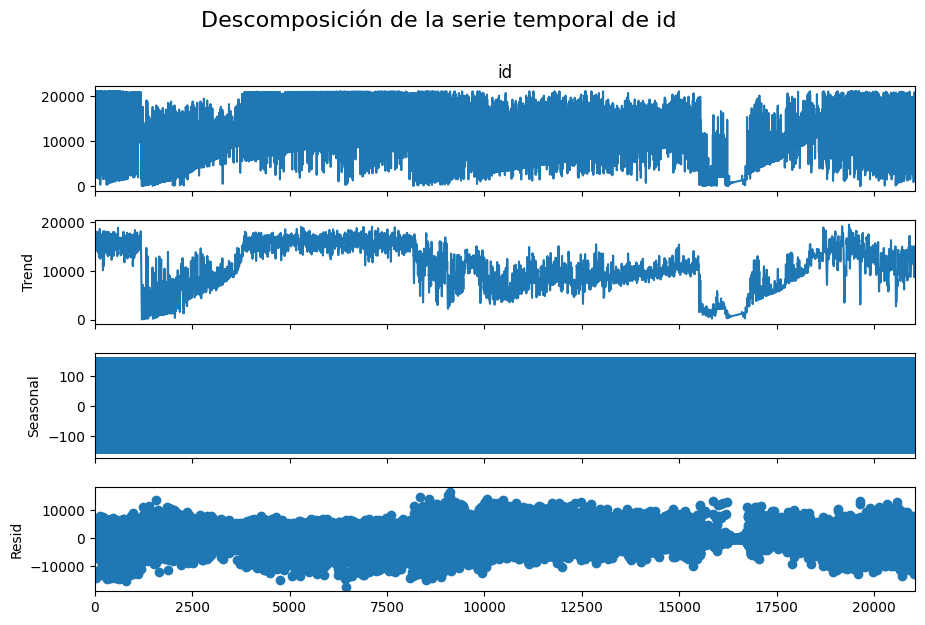

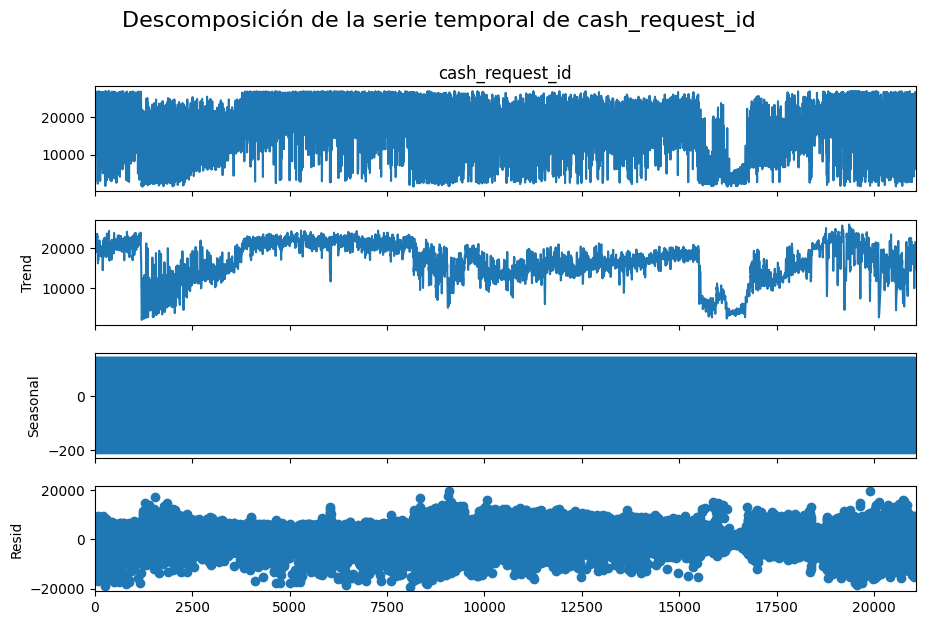

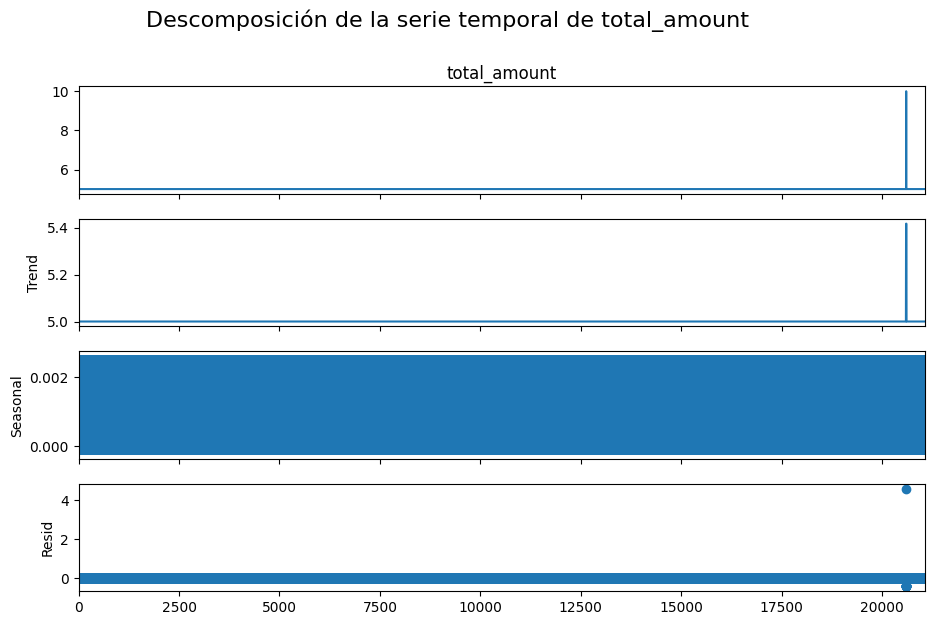

In [ ]:
# Descomposición de series temporales para cada columna numérica individual
for c in columnas_numericas_fees:
    # Crear una copia del DataFrame para trabajar
    fees_copy = fees[c].copy()

    # Verificar si hay valores faltantes y eliminarlos o interpolarlos
    if fees_copy.isnull().any():
        fees_copy = fees_copy.interpolate()  # Rellenar NaN con interpolación
        fees_copy = fees_copy.dropna()  # Eliminar filas con valores faltantes

    # Verificar que no haya valores no finitos
    if not np.isfinite(fees_copy).all():
        print(f'La columna {c} contiene valores no finitos, se omite la descomposición.')
        continue

    # Descomposición de la serie temporal
    descomposicion = seasonal_decompose(fees_copy, model='additive', period=12)

    # Graficar la descomposición
    fig = descomposicion.plot()

    # Ajustar el tamaño de la figura con matplotlib
    plt.gcf().set_size_inches(10, 6)

    # Ajustar el título para que no se superponga
    fig.suptitle(f'Descomposición de la serie temporal de {c}', fontsize=16, y=1.05)

    # Mostrar el gráfico
    plt.show()


LIMPIEZA DE DATOS

In [ ]:
# Crear copias de los datos originales
cash_request_cleaned = cash_request.copy()
fees_cleaned = fees.copy()


In [ ]:
# Rellenar valores faltantes solo en columnas numéricas con la mediana
num_columns_cash_request = cash_request_cleaned.select_dtypes(include=['float64', 'int64']).columns
cash_request_cleaned[num_columns_cash_request] = cash_request_cleaned[num_columns_cash_request].fillna(
    cash_request_cleaned[num_columns_cash_request].median()
)

num_columns_fees = fees_cleaned.select_dtypes(include=['float64', 'int64']).columns
fees_cleaned[num_columns_fees] = fees_cleaned[num_columns_fees].fillna(
    fees_cleaned[num_columns_fees].median()
)

# Rellenar valores faltantes en columnas categóricas con un valor predeterminado ('desconocido')
cat_columns_cash_request = cash_request_cleaned.select_dtypes(include=['object', 'category']).columns
cash_request_cleaned[cat_columns_cash_request] = cash_request_cleaned[cat_columns_cash_request].fillna('desconocido')

cat_columns_fees = fees_cleaned.select_dtypes(include=['object', 'category']).columns
fees_cleaned[cat_columns_fees] = fees_cleaned[cat_columns_fees].fillna('desconocido')

# Manejo de fechas: Rellenar valores faltantes con una fecha específica o eliminar
date_columns_cash_request = cash_request_cleaned.select_dtypes(include=['datetime64[ns]']).columns
cash_request_cleaned[date_columns_cash_request] = cash_request_cleaned[date_columns_cash_request].fillna(pd.Timestamp('1900-01-01'))

date_columns_fees = fees_cleaned.select_dtypes(include=['datetime64[ns]']).columns
fees_cleaned[date_columns_fees] = fees_cleaned[date_columns_fees].fillna(pd.Timestamp('1900-01-01'))

# Validación de limpieza
print("\nValores faltantes después de limpieza - Cash Request:")
print(cash_request_cleaned.isnull().sum())

print("\nValores faltantes después de limpieza - Fees:")
print(fees_cleaned.isnull().sum())




Valores faltantes después de limpieza - Cash Request:
id                            0
amount                        0
status                        0
created_at                    0
updated_at                    0
user_id                       0
moderated_at                  0
reimbursement_date            0
cash_request_received_date    0
money_back_date               0
transfer_type                 0
send_at                       0
dtype: int64

Valores faltantes después de limpieza - Fees:
id                 0
cash_request_id    0
type               0
status             0
total_amount       0
reason             0
created_at         0
updated_at         0
paid_at            0
charge_moment      0
dtype: int64
